# 08 - Billboard + Lyrics

In [1]:
import warnings
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
#import seaborn as sns

from gensim.models import Word2Vec
from matplotlib import rcParams
from matplotlib.patches import Rectangle
from scipy.stats import relfreq
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from nltk.corpus import stopwords
from wordcloud import WordCloud

#sns.set(context='poster', style='white')
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'times new roman'

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

warnings.filterwarnings('ignore')

## Load data

In [16]:
df = pd.read_csv('../data/billboard-lyrics-spotify.csv')
df.sample(3)

,artist_all,artist_base,rank,song,year,artist_featured,song_clean,artist_clean,lyrics,acousticness,...,key,liveness,loudness,mode,popularity,release_date,speechiness,tempo,time_signature,valence
785,neil diamond,neil diamond,86,"girl, you'll be a woman soon",1967,NaN,girl youll be a woman soon,neil diamond,girl youll be a woman soon i love you so muc...,0.5570,...,5.0,0.3900,-5.550,1.0,49.0,1968,0.0276,109.733,4.0,0.6780
4655,field mob featuring ciara,field mob,55,so what,2006,ciara,so what,field mob,jazze pha ladies and gentlemen jazze pha fiel...,0.0676,...,6.0,0.0716,-10.551,1.0,50.0,2006-01-01,0.1610,119.980,4.0,0.9000
3753,barbra streisand and bryan adams,barbra streisand,53,i finally found someone,1997,NaN,i finally found someone,barbra streisand,barbra streisand bryan adams bryan adams i f...,0.6740,...,6.0,0.1270,-15.069,1.0,57.0,1996-10-15,0.0289,139.009,4.0,0.0707


## Pre-processing

In [3]:
df['artist_clean'] = df['artist_clean'].replace('beyonce knowles', 'beyonce')

# # remove duplicate songs
# df = df.drop_duplicates(subset=['artist_clean', 'song_clean'], keep='first')

# strip whitespace at beginning and ends of artist columns
artist_cols = ['artist_base', 'artist_all', 'artist_featured', 'artist_clean']
df[artist_cols] = df[artist_cols].applymap(
    lambda x: x.strip() if not isinstance(x, float) else np.nan)
df.shape

(5801, 25)

In [5]:
df['duration_min'] = df['duration_ms'] / 1000 / 60
df = df.drop('duration_ms', axis=1)
df['num_words'] = df['lyrics'].apply(
    lambda x: len(x.split()) if not isinstance(x, float) else np.nan)
df['words_per_sec'] = df['num_words'] / (df['duration_min'] * 60)
df['num_uniq_words'] = df['lyrics'].apply(
    lambda x: pd.Series(x.split()).nunique() if not isinstance(x, float) else np.nan)
df['decade'] = df['year'] // 10 * 10
df['uniq_ratio'] = df['num_uniq_words'] / df['num_words']

In [38]:
df_nonnull = df[df['lyrics'].notnull()]
lyrics = df_nonnull['lyrics']

## Verbosity over time

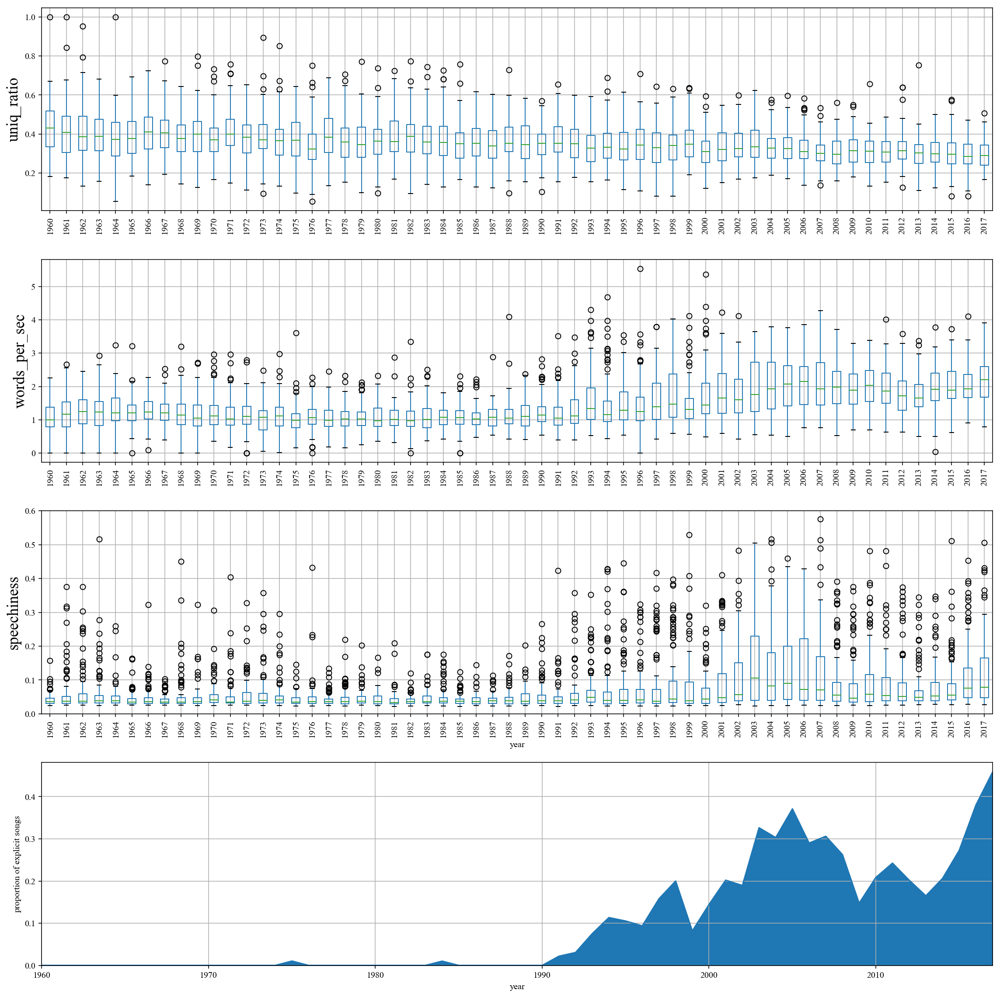

In [56]:
# make subplot axes
verbal_features = ['uniq_ratio', 'words_per_sec', 'speechiness']
fig, axes = plt.subplots(4, 1, figsize=(16, 16))

# make time series boxplots
for ax, verbal_feature in zip(axes, verbal_features):
    df[['year',verbal_feature]].boxplot(by='year', rot = 90, ax=ax)
    ax.set(title='', xlabel='')
    ax.set_ylabel(verbal_feature, fontsize=18)
axes[2].set(xlabel='year', ylim=(0, 0.6))

# make time series line plot
df_nonnull.groupby('year')['explicit'].mean().plot.area(ax=axes[3], grid=True)
axes[3].set(ylabel='proportion of explicit songs', alpha=0.5)

# suppress pandas boxplot title
plt.suptitle('')
plt.tight_layout()

## Most verbose artists

In [7]:
# when creating word clouds, maps word fontsize to a color
class colormap_size_func(object):
    def __init__(self, colormap, max_font_size):
        import matplotlib.pyplot as plt
        self.colormap = plt.cm.get_cmap(colormap)
        self.max_font_size = max_font_size

    def __call__(self, word, font_size, position, orientation,
                 random_state=None, **kwargs):
        if random_state is None:
            random_state = Random()
        r, g, b, _ = 255 * np.array(self.colormap(font_size / self.max_font_size))
        return "rgb({:.0f}, {:.0f}, {:.0f})".format(r, g, b)

In [8]:
# for each artist, average verbal feature profile of their songs
verbal_features = ['uniq_ratio', 'words_per_sec']
X_artists = df_nonnull.groupby('artist_clean')[verbal_features].mean()

# filter for artists with at least 5 hit singles
top_artists = df_nonnull.groupby('artist_clean')['song'].count()
top_artists = top_artists[top_artists >= 5]
X_artists = X_artists.reindex(top_artists.index)

# create inverse uniq_ratio (aka repetitiveness ratio)
X_artists[['uniq_ratio_inv', 'words_per_sec_inv']] = \
    X_artists[['uniq_ratio', 'words_per_sec']].apply(
    lambda x: 1 / x)

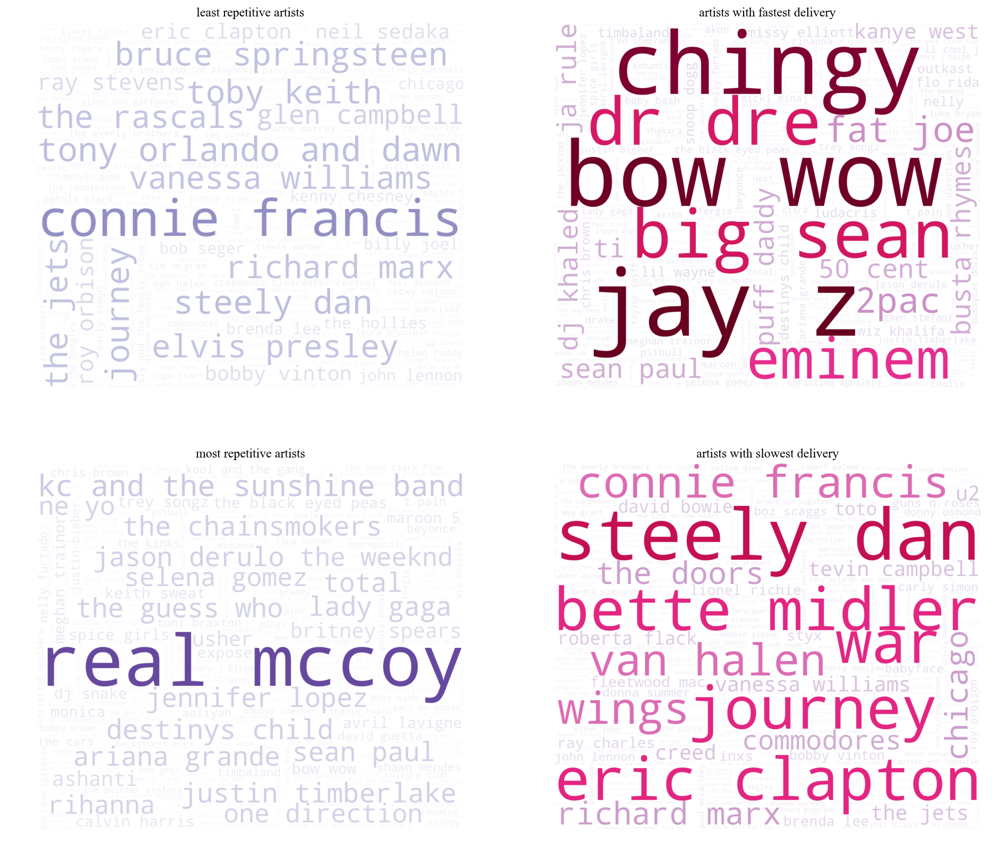

In [57]:
# make subplot axes
fig, axes = plt.subplots(2, 2, figsize=(16,14))
axes = axes.ravel()
verbal_features = ['uniq_ratio', 'words_per_sec',
                   'uniq_ratio_inv', 'words_per_sec_inv']
title = ['most repetitive artists', 'artists with fastest delivery',
         'least repetitive artists', 'artists with slowest delivery']
colormaps = ['Purples', 'PuRd'] * 2

for i in range(len(verbal_features)):
    # make word-weight dictionary
    color_func = colormap_size_func(colormaps[i], 300)
    feature = X_artists[verbal_features[i]] + 1e-3
    dictionary = dict(zip(X_artists.index, feature))
    
    # make word cloud
    wordcloud = WordCloud(background_color='white', height=1200,
                          min_font_size=5, width=1400, color_func=color_func,
                          max_words=len(X_artists), relative_scaling=0.5,
                          max_font_size=300)
    wordcloud = wordcloud.generate_from_frequencies(dictionary)
    
    # display wordcloud
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set(title=title[i])

## Most decade specific words

In [9]:
def ngram_wordclouds(n=1, min_df=50):
    # make features and targets
    X = lyrics.copy()
    y = df_nonnull['decade']
    
    # make and fit Naive Bayes model
    stop_words = list(ENGLISH_STOP_WORDS)
    stop_words.extend(['shes', 'yes', 'didnt'])
    pipe = Pipeline([('count', CountVectorizer(min_df=min_df, binary=True,
                                    ngram_range=(n,n), stop_words=stop_words)),
                     ('bnb', BernoulliNB(binarize=0))])
    pipe.fit(X, y)

    # calculate class conditional feature probabilities and ...
    # unconditioned feature probabilities.
    feature_counts = pipe.named_steps.count.transform(lyrics).toarray().sum(axis=0)
    class_feature_counts = pipe.named_steps.bnb.feature_count_
    con_feat_probs = class_feature_counts / class_feature_counts.sum(axis=1).reshape(-1, 1)
    unc_feat_probs = feature_counts / feature_counts.sum()
    
    # conditional probability / unconditional probability = lift
    lift = con_feat_probs / unc_feat_probs + 1e-10
    
    # make subplot axes
    fig, axes = plt.subplots(2, 3, figsize=(16,10))
    axes = axes.ravel()

    colormaps = ['Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'PuRd']
    vocab = pipe.named_steps.count.get_feature_names()
    for i, decade in enumerate(range(1960, 2020, 10)):
        # make word-weight dictionary
        color_func = colormap_size_func(colormaps[i], 300)
        feature = lift[i,:]
        dictionary = dict(zip(vocab, feature))
        
        # make word cloud
        wordcloud = WordCloud(background_color='white', height=1200,
                              min_font_size=5, width=1400, color_func=color_func,
                              max_words=len(X_artists), relative_scaling=0.5,
                              max_font_size=300)
        wordcloud = wordcloud.generate_from_frequencies(dictionary)
        
        # display word cloud
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].axis('off')
        axes[i].set(title='most {}s {}-grams'.format(decade, n))

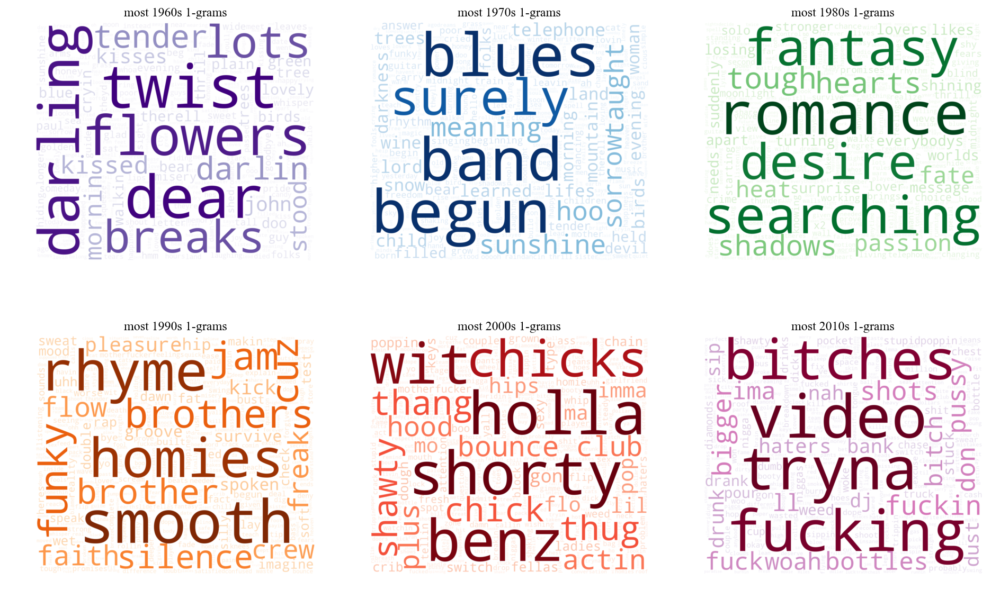

In [10]:
ngram_wordclouds()

## Most decade specific n-grams

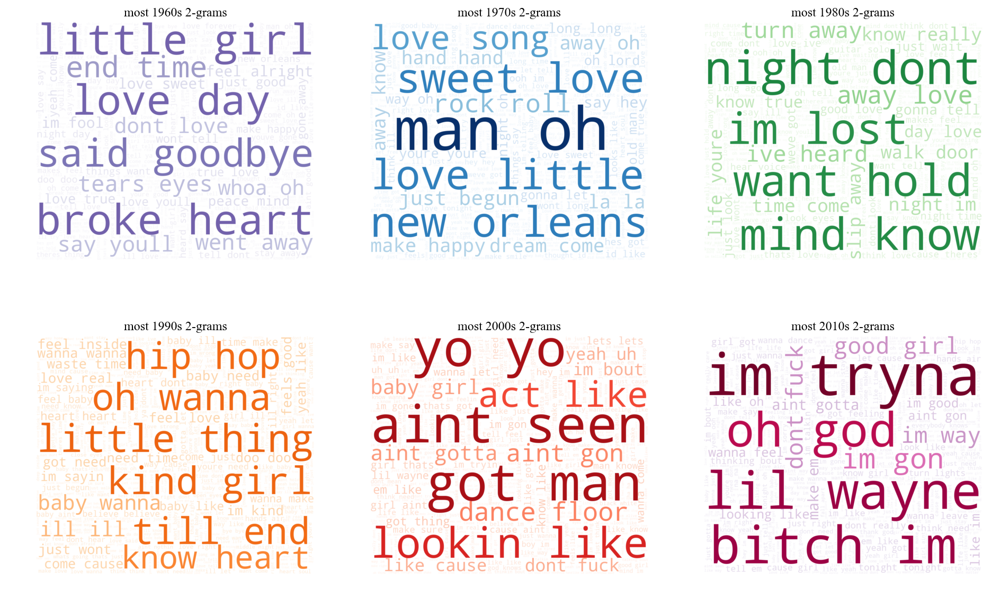

In [11]:
ngram_wordclouds(2, 30)

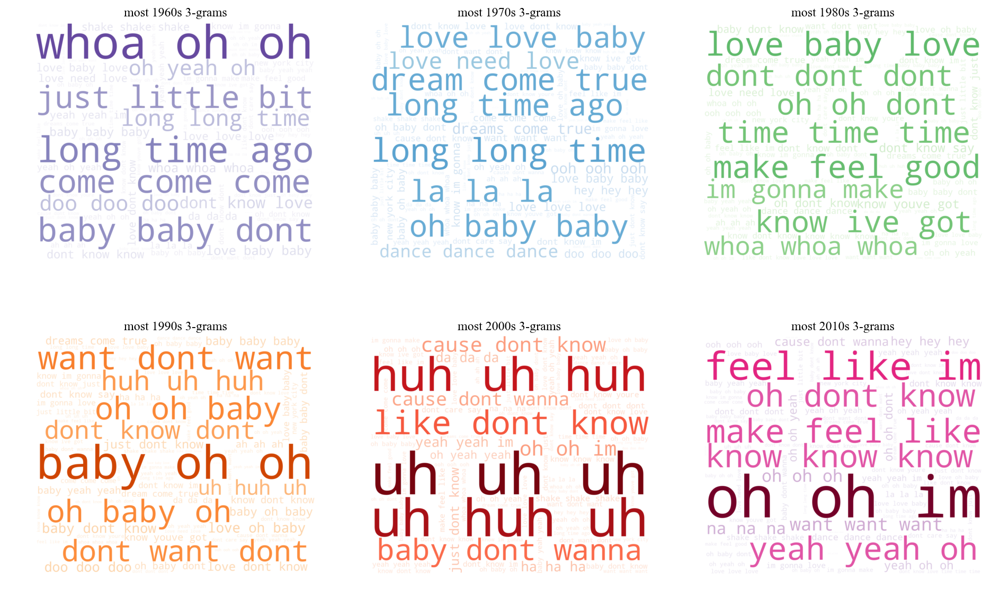

In [293]:
ngram_wordclouds(3, 10)

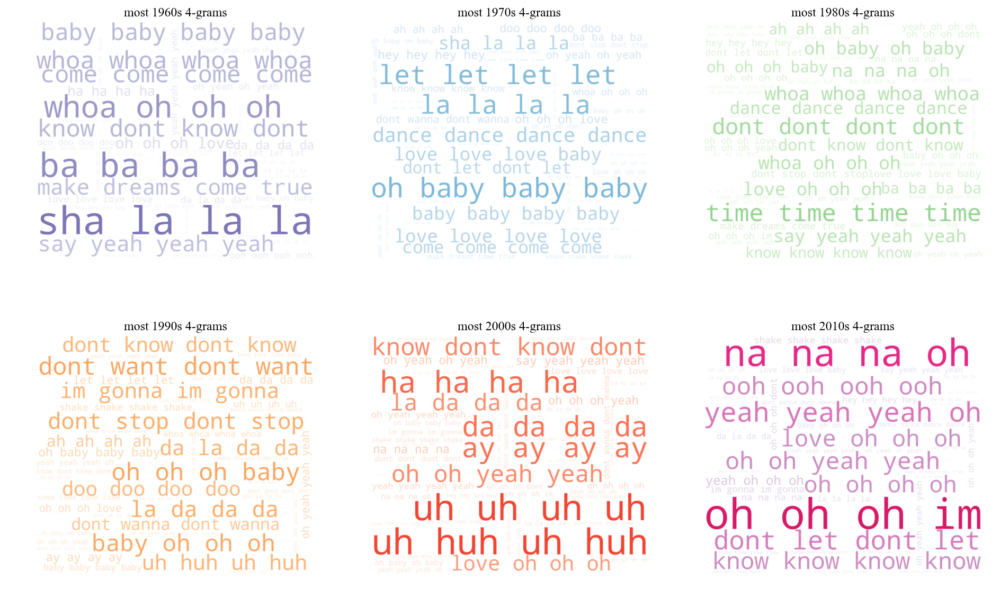

In [297]:
ngram_wordclouds(4, 10)

## Word frequencies over time

In [35]:
import seaborn as sns
sns.set(context='poster', style='white')

# convert each row into a dataframe where each row is a word instead of song
def row_to_df(x):
    if not isinstance(x['lyrics'], str):
        return None
    else:
        nonlyrics = x.drop('lyrics')
        lyrics = pd.Series(x.lyrics.split()).value_counts()
        lyrics = pd.DataFrame(lyrics).reset_index()
        lyrics.columns = ['word', 'count']
        lyrics['dummy'] = 1
        nonlyrics['dummy'] = 1
        nonlyrics = pd.DataFrame(nonlyrics).T
        return pd.merge(nonlyrics, lyrics, how='right', on='dummy')

# concatenates all word-based dataframes into a single word-based dataframe
def tidy_df(df):
    df_list = list()
    for index, row in df.iterrows():
        song_df = row_to_df(row)
        df_list.append(song_df)
    return pd.concat(df_list, axis=0)

In [39]:
df_tidy = tidy_df(df_nonnull)

# make list of words that appear in at least 10 unique songs
songs_per_word = df_tidy.groupby('word')['song'].agg(pd.Series.nunique)
songs_per_word = songs_per_word[songs_per_word >= 10]
words_to_keep = list(songs_per_word.index)

# keep only words that appear in at least 10 unique songs and their ...
# ...corresponding years of appearance
mask = df_tidy['word'].apply(lambda x: x in words_to_keep)
df_tidy = df_tidy.loc[mask,:][['word', 'year', 'count']]

# calculate frequencies of surviving words
words_freq = df_tidy.groupby(['year','word'])['count'].sum()
wf2 = words_freq.reset_index()

In [45]:
def word_time_series(words, colors):
    plt.figure(figsize=(16,5))
    ax = plt.axes()
    words = words
    colors = colors
    for word, color in zip(words, colors):
        wf2[wf2['word']==word].plot.line(
            x='year', y='count', ax=ax, label=word, color=color, linewidth=2)
    ax.grid(True)
    ax.set(ylabel='frequency');

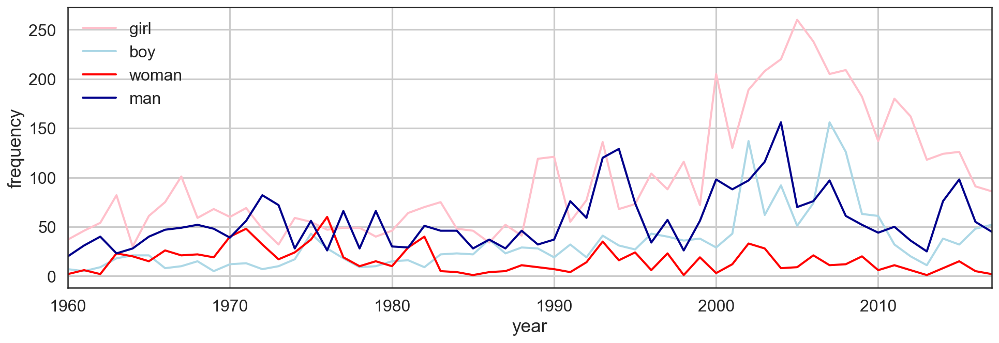

In [46]:
word_time_series(words=['girl', 'boy', 'woman', 'man'],
                 colors = ['pink', 'lightblue', 'red', 'darkblue'])

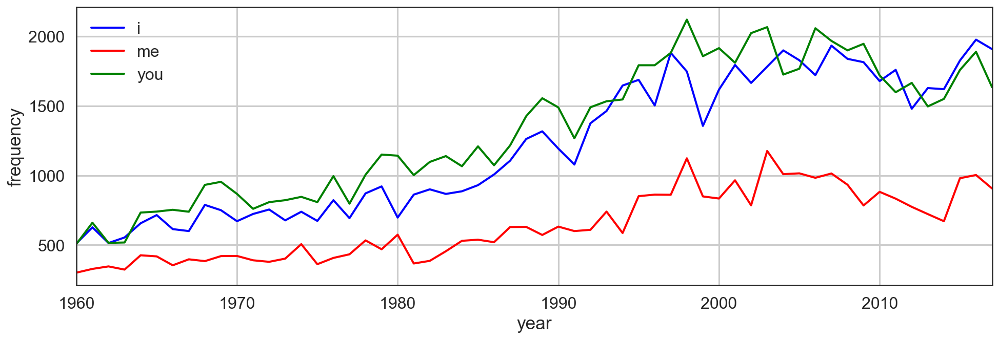

In [48]:
word_time_series(words=['i', 'me', 'you'],
                 colors=['blue', 'red', 'green'])

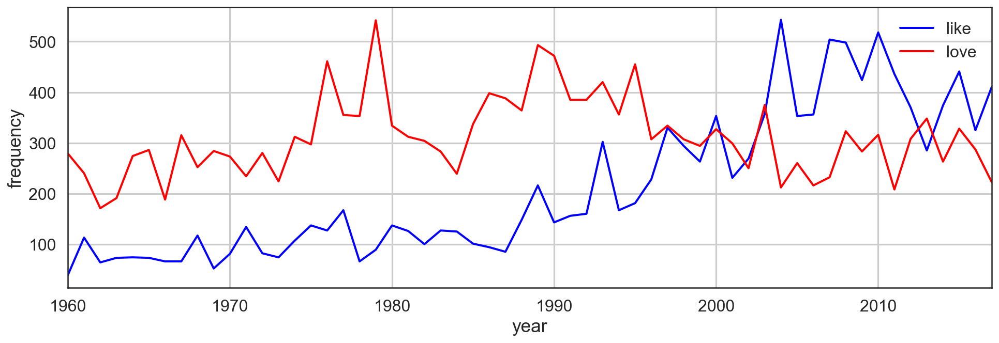

In [49]:
word_time_series(words=['like', 'love'],
                 colors = ['blue', 'red'])

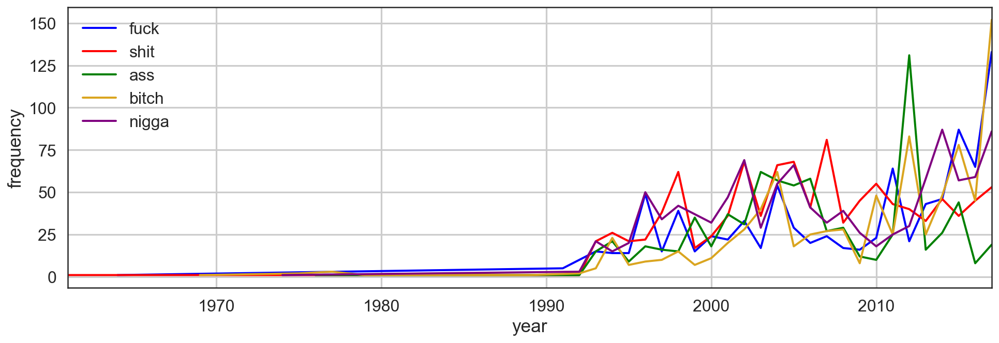

In [52]:
word_time_series(words=['fuck', 'shit', 'ass', 'bitch', 'nigga'],
                 colors = ['blue', 'red', 'green', 'goldenrod', 'purple'])

## Latent space embeddings

In [519]:
df_nonnull = df[df['lyrics'].notnull()]
df_nonnull = df_nonnull.drop_duplicates(subset=['artist_clean', 'song_clean'], keep='first')

lyrics = df_nonnull['lyrics']
top_artists = df_nonnull.groupby('artist_clean')['song']\
                      .count()\
                      .sort_values(ascending=False)\
                      .index

X_entity_dfs = list()
count = CountVectorizer()
X_lyrics = count.fit_transform(lyrics)
X_lyrics = pd.DataFrame(X_lyrics.todense(), columns=count.get_feature_names())
X_songs = X_lyrics.set_index(df_nonnull['song'])
X_songs.index = [str('song_') + val for val in X_songs.index]
X_entity_dfs.append(X_songs)
X_songs_cp = X_songs.copy(deep=True)

artists = df_nonnull['artist_clean']
artists.index = X_songs_cp.index
X_songs_cp['artist_clean'] = artists
X_artists = X_songs_cp.groupby('artist_clean').mean()
X_artists = X_artists.reindex(top_artists).iloc[:20,:]
X_artists.index = [str('artist_') + val for val in X_artists.index]
X_entity_dfs.append(X_artists)

explicit = df_nonnull['explicit']
explicit.index = X_songs_cp.index
X_songs_cp['explicit'] = explicit
X_explicit = X_songs_cp.groupby('explicit').mean()
X_explicit.index = ['explicit_0', 'explicit_1']
X_entity_dfs.append(X_explicit)

decade = df_nonnull['decade']
decade.index = X_songs_cp.index
X_songs_cp['decade'] = decade
X_decade = X_songs_cp.groupby('decade').mean()
X_decade.index = ['decade_' + str(x) for x in range(1960, 2020, 10)]
X_entity_dfs.append(X_decade)

mode = df_nonnull['mode']
mode.index = X_songs_cp.index
X_songs_cp['mode'] = mode
X_mode = X_songs_cp.groupby('mode').mean()
X_mode.index = ['mode_0', 'mode_1']
X_entity_dfs.append(X_mode)

entities_index = list()
for X_entity_df in X_entity_dfs:
    entities_index.extend(list(X_entity_df.index))

X_entities = pd.concat(X_entity_dfs, axis='rows')
X_entities.index = entities_index

In [524]:
X_drop = X_entities.drop(['explicit', 'mode', 'decade'], axis='columns')

lda = LatentDirichletAllocation(n_components=10)
X_lda = lda.fit_transform(X_drop)

tsne = TSNE(n_components=2, metric='cosine', perplexity=75)
X_tsne = tsne.fit_transform(X_lda)

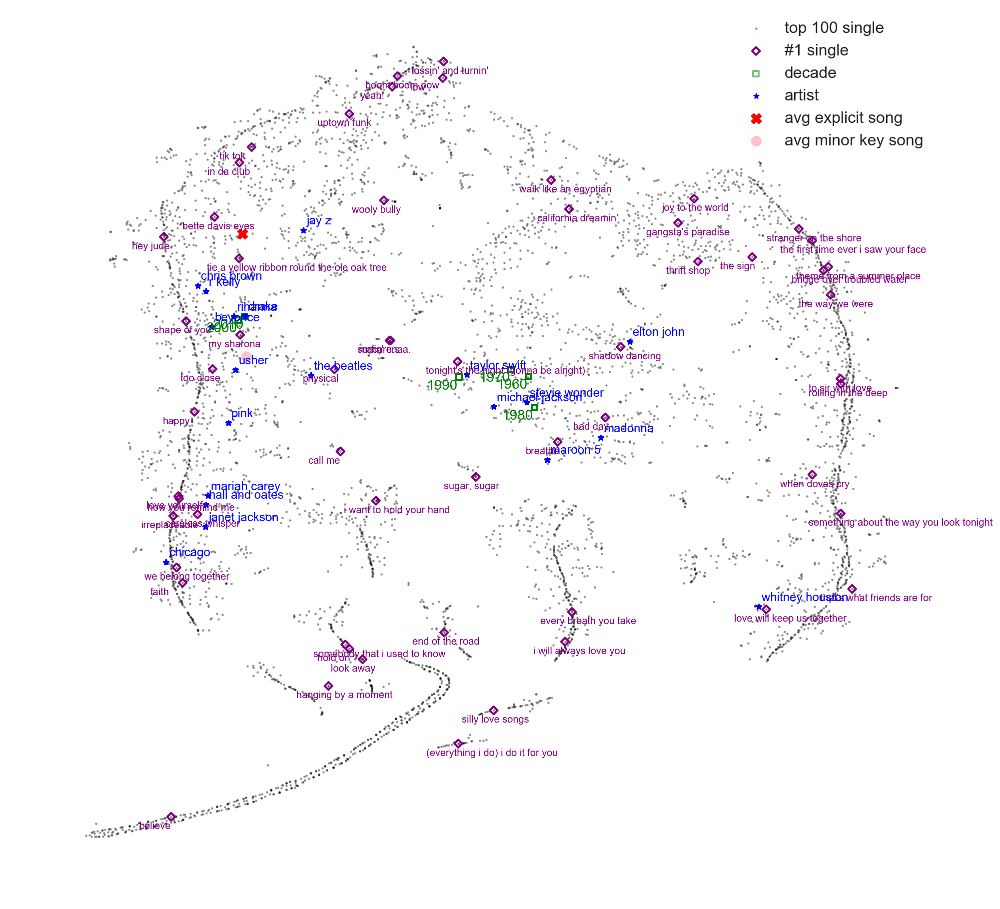

In [536]:
plt.figure(figsize=(16,16))
ax = plt.gca()

song_mask = X_entities.index.str.startswith('song_')
X_tsne_songs = X_tsne[song_mask,:]
ax.scatter(X_tsne_songs[:,0], X_tsne_songs[:,1], s=2, color='black', alpha=0.3,
           label='top 100 single', edgecolor='black', linewidth=1)

top_single_mask = df_nonnull['rank'] == 1
top_singles = df_nonnull.loc[top_single_mask, :]['song'].values
X_tsne_top = X_tsne[song_mask,:][top_single_mask,:]
for i in range(X_tsne_top.shape[0]):
    label = None
    if i == len(X_tsne_top) - 1:
        label = '#1 single'
    ax.annotate(top_singles[i], xy=X_tsne_top[i,:], color='purple',
                textcoords='offset points', xytext=(-32,-12), fontsize=10)
    ax.scatter(X_tsne_top[i,0], X_tsne_top[i,1], marker='D', color='None',
               linewidth=2, edgecolor='purple', s=30, label=label)

decade_mask = X_entities.index.str.startswith('decade_')
X_tsne_decade = X_tsne[decade_mask,:]
for i in range(X_tsne_decade.shape[0]):
    decade = X_entities.iloc[decade_mask,:].index[i][7:]
    label = None
    if decade == '2010':
        label = 'decade'
    ax.annotate(decade, xy=X_tsne_decade[i,:], color='green',
                textcoords='offset points', xytext=(-32,-12), fontsize=14)
    ax.scatter(X_tsne_decade[:,0], X_tsne_decade[:,1], marker='s', s=30,
               linewidth=2, alpha=0.5, edgecolor='green', color='None',
               label=label)
    
artists_mask = X_entities.index.str.startswith('artist_')
X_tsne_artists = X_tsne[artists_mask,:]
for i in range(X_tsne_artists.shape[0]):
    artist = X_artists.index[i][7:]
    label = None
    if i == len(X_tsne_artists) - 1:
        label = 'artist'
    ax.annotate(artist, xy=X_tsne_artists[i,:], color='blue',
                textcoords='offset points', xytext=(3,6), fontsize=12)
    ax.scatter(X_tsne_artists[:,0], X_tsne_artists[:,1], marker='*', s=30,
               linewidth=1, color='blue', label=label)
    
explicit_mask = X_entities.index == 'explicit_1'    
x,y = X_tsne[explicit_mask,:].squeeze()
ax.scatter(x, y, marker='X', s=100, linewidth=1, alpha=1, color='red',
           label='avg explicit song')

minor_mask = X_entities.index == 'mode_0'    
x,y = X_tsne[minor_mask,:].squeeze()
ax.scatter(x, y, marker='8', s=100, linewidth=1, alpha=1, color='pink',
           label='avg minor key song')

ax.legend()

#ax.set(xlim=(-35,35), ylim=(-100,100))
ax.axis('off');